Importing the required libraries which are usually used for a routin Exploratory Data Analysis (EDA)

In [28]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import calmap
from pandas_profiling import ProfileReport
%matplotlib inline

Reading/importing the dataset, which is supermarket.csv

In [2]:
dataset = pd.read_csv('supermarket.csv')


Returning the first five rows of the dataset as a quick check of data format. The number of rows can be specified by putting the number inside the parentheses: 
Example: dataset.head(10) or dataset(13)

In [3]:
dataset.head()

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating
0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,1/5/2019,13:08,Ewallet,522.83,4.761905,26.1415,9.1
1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,3/8/2019,10:29,Cash,76.40,4.761905,3.8200,9.6
2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,3/3/2019,13:23,Credit card,324.31,4.761905,16.2155,7.4
3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,1/27/2019,20:33,Ewallet,465.76,4.761905,23.2880,8.4
4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,2/8/2019,10:37,Ewallet,604.17,4.761905,30.2085,5.3


Returning the column lables of the dataset

In [40]:
dataset.columns



Index(['Invoice ID', 'Branch', 'City', 'Customer type', 'Gender',
       'Product line', 'Unit price', 'Quantity', 'Tax 5%', 'Total', 'Time',
       'Payment', 'cogs', 'gross margin percentage', 'gross income', 'Rating'],
      dtype='object')

Specifying the data type of each column in order to rectify/prevent any potential format error

In [37]:
dataset.dtypes




Invoice ID                         object
Branch                             object
City                               object
Customer type                      object
Gender                             object
Product line                       object
Unit price                        float64
Quantity                            int64
Tax 5%                            float64
Total                             float64
Date                       datetime64[ns]
Time                               object
Payment                            object
cogs                              float64
gross margin percentage           float64
gross income                      float64
Rating                            float64
dtype: object

Since the data type of Date column is not Date format (it was wrongly in "Object" format), it is rectified by the following code:

In [36]:
dataset['Date'] = pd.to_datetime(dataset['Date'])






As a part of routine EDA, Date column is set as the "Index."

In [38]:
dataset.set_index('Date',inplace=True)

The output table below shows that Date column changed to the index column 

In [39]:
dataset.head()

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Time,Payment,cogs,gross margin percentage,gross income,Rating
Date,,,,,,,,,,,,,,,,
2019-01-05,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,13:08,Ewallet,522.83,4.761905,26.1415,9.1
2019-03-08,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,10:29,Cash,76.40,4.761905,3.8200,9.6
2019-03-03,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,13:23,Credit card,324.31,4.761905,16.2155,7.4
2019-01-27,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,20:33,Ewallet,465.76,4.761905,23.2880,8.4
2019-02-08,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,10:37,Ewallet,604.17,4.761905,30.2085,5.3


Returning the descriptive summary statistics of the dataset:

In [42]:
dataset.describe()

,Unit price,Quantity,Tax 5%,Total,cogs,gross margin percentage,gross income,Rating
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000
mean,55.672130,5.510000,15.379369,322.966749,307.58738,4.761905,15.379369,6.97270
std,26.494628,2.923431,11.708825,245.885335,234.17651,0.000000,11.708825,1.71858
min,10.080000,1.000000,0.508500,10.678500,10.17000,4.761905,0.508500,4.00000
25%,32.875000,3.000000,5.924875,124.422375,118.49750,4.761905,5.924875,5.50000
50%,55.230000,5.000000,12.088000,253.848000,241.76000,4.761905,12.088000,7.00000
75%,77.935000,8.000000,22.445250,471.350250,448.90500,4.761905,22.445250,8.50000
max,99.960000,10.000000,49.650000,1042.650000,993.00000,4.761905,49.650000,10.00000


By .hist, all distribution graphs, histogram graphs, are plotted. Therefore, by the above command it is easy and quick to have a look at all the graphs at once.

array([[<AxesSubplot: title={'center': 'Unit price'}>,
        <AxesSubplot: title={'center': 'Quantity'}>,
        <AxesSubplot: title={'center': 'Tax 5%'}>],
       [<AxesSubplot: title={'center': 'Total'}>,
        <AxesSubplot: title={'center': 'cogs'}>,
        <AxesSubplot: title={'center': 'gross margin percentage'}>],
       [<AxesSubplot: title={'center': 'gross income'}>,
        <AxesSubplot: title={'center': 'Rating'}>, <AxesSubplot: >]],
      dtype=object)

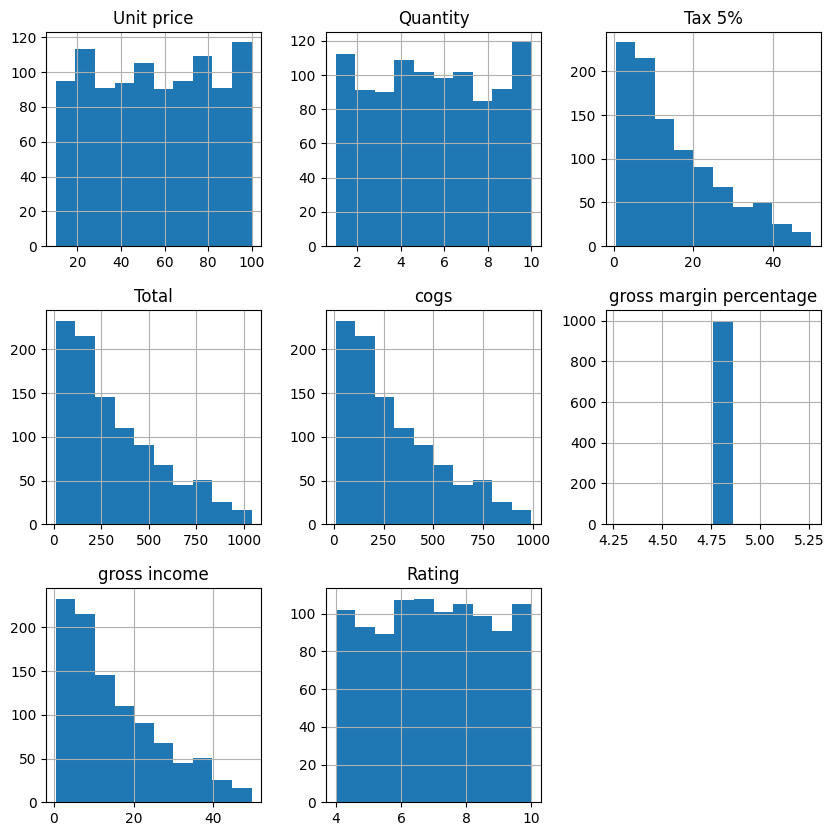

In [47]:
dataset.hist(figsize=(10,10))


As an example of plotting, the distribution customer rating column was plotted:

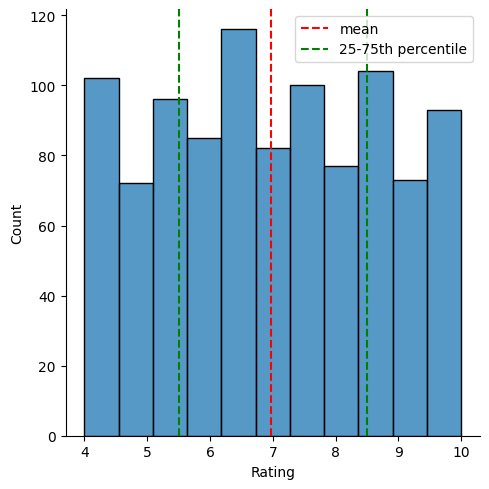

In [60]:

sns.displot(dataset['Rating'])
plt.axvline(x=np.mean(dataset['Rating']),c='red',ls='--', label='mean')
plt.axvline(x=np.percentile(dataset['Rating'],25),c='green',ls='--', label='25-75th percentile')
plt.axvline(x=np.percentile(dataset['Rating'],75),c='green',ls='--')
plt.legend(loc = 'upper right')



Returning the aggregate sales by different branches (a comparison between A, B and C):

A    340
B    332
C    328
Name: Branch, dtype: int64

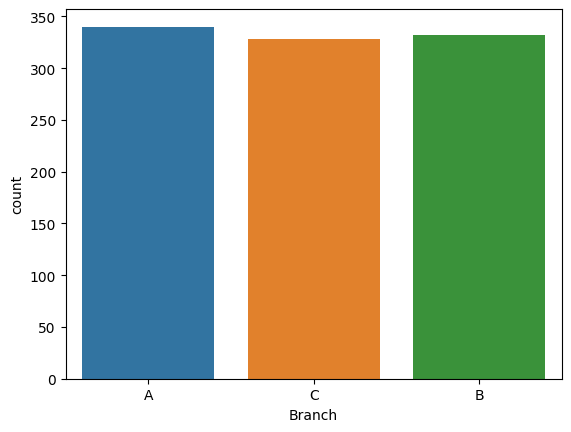

In [63]:
dataset['Branch'].value_counts()
#OR:dataset.Branch.value_counts(sort=False)
sns.countplot(x='Branch', data=dataset)



Returning the aggregate sales by different payment methods (a comparison between Ewallet, Cash and Creadit card):

<AxesSubplot: xlabel='Payment', ylabel='count'>

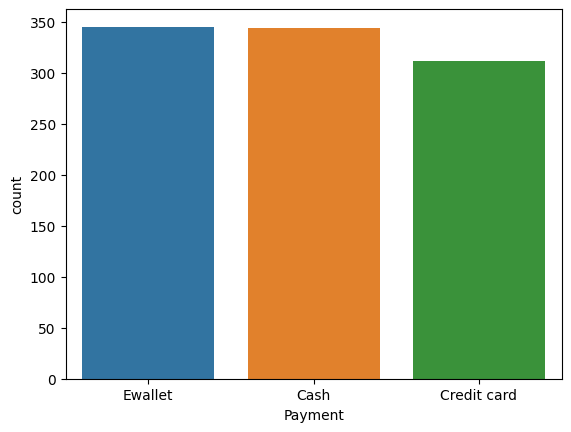

In [64]:
dataset['Payment'].value_counts()
#OR:dataset.Payment.value_counts(sort=False)
sns.countplot(x='Payment', data=dataset)
#Popularity of payment methods




A Bivarite Anlaysis to understand the relationship between Rating column and gross income:

<AxesSubplot: xlabel='Rating', ylabel='gross income'>

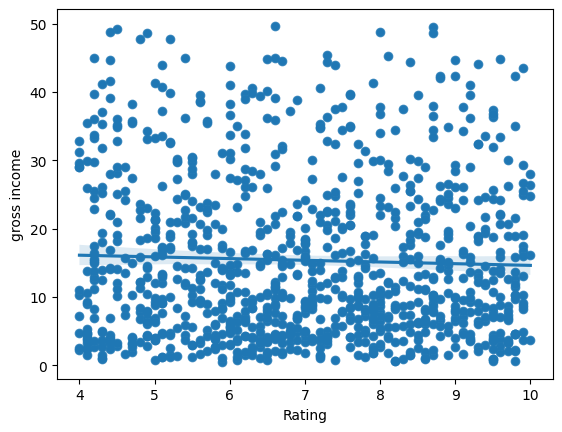

In [65]:
sns.scatterplot(x='Rating',y='gross income', data=dataset)

sns.regplot(x='Rating',y='gross income', data=dataset)
#A linear regression model fit

Displaying boxpots between gross income and branches. The boxplots contains minimum, lower quartile, median, upper quartile and maximum values. 

<AxesSubplot: xlabel='Branch', ylabel='gross income'>

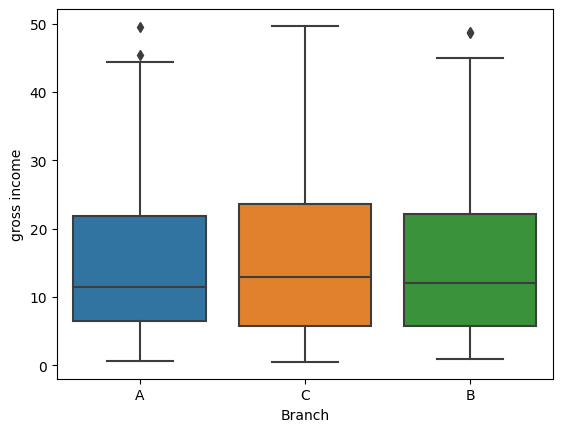

In [66]:
sns.boxplot(x=dataset['Branch'], y=dataset['gross income'])
#Distribution or relationship between Branch and gross income

Displaying the trend between gross income and time. In order to do so, the dataset must be grouped by date, thereby aggregating the gross income by date:

In [68]:
dataset.groupby(dataset.index).mean()


C:\Users\User\AppData\Local\Temp\ipykernel_17500\1620001615.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  dataset.groupby(dataset.index).mean()


,Unit price,Quantity,Tax 5%,Total,cogs,gross margin percentage,gross income,Rating
Date,,,,,,,,
2019-01-01,54.995833,6.750000,18.830083,395.431750,376.601667,4.761905,18.830083,6.583333
2019-01-02,44.635000,6.000000,11.580375,243.187875,231.607500,4.761905,11.580375,6.050000
2019-01-03,59.457500,4.625000,12.369813,259.766062,247.396250,4.761905,12.369813,8.112500
2019-01-04,51.743333,5.333333,12.886417,270.614750,257.728333,4.761905,12.886417,6.516667
2019-01-05,61.636667,4.583333,14.034458,294.723625,280.689167,4.761905,14.034458,7.433333
...,...,...,...,...,...,...,...,...
2019-03-26,42.972308,4.000000,7.188692,150.962538,143.773846,4.761905,7.188692,6.623077
2019-03-27,56.841000,4.500000,13.822950,290.281950,276.459000,4.761905,13.822950,6.760000
2019-03-28,45.525000,4.800000,10.616200,222.940200,212.324000,4.761905,10.616200,7.050000


As shown, there are 89 days the gross income of which to be calculated:

In [70]:
dataset.groupby(dataset.index).mean().index

C:\Users\User\AppData\Local\Temp\ipykernel_17500\2222740376.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  dataset.groupby(dataset.index).mean().index


DatetimeIndex(['2019-01-01', '2019-01-02', '2019-01-03', '2019-01-04',
               '2019-01-05', '2019-01-06', '2019-01-07', '2019-01-08',
               '2019-01-09', '2019-01-10', '2019-01-11', '2019-01-12',
               '2019-01-13', '2019-01-14', '2019-01-15', '2019-01-16',
               '2019-01-17', '2019-01-18', '2019-01-19', '2019-01-20',
               '2019-01-21', '2019-01-22', '2019-01-23', '2019-01-24',
               '2019-01-25', '2019-01-26', '2019-01-27', '2019-01-28',
               '2019-01-29', '2019-01-30', '2019-01-31', '2019-02-01',
               '2019-02-02', '2019-02-03', '2019-02-04', '2019-02-05',
               '2019-02-06', '2019-02-07', '2019-02-08', '2019-02-09',
               '2019-02-10', '2019-02-11', '2019-02-12', '2019-02-13',
               '2019-02-14', '2019-02-15', '2019-02-16', '2019-02-17',
               '2019-02-18', '2019-02-19', '2019-02-20', '2019-02-21',
               '2019-02-22', '2019-02-23', '2019-02-24', '2019-02-25',
      

Mean gross income in each day (as the index in x axis) arew shown through the code below:

C:\Users\User\AppData\Local\Temp\ipykernel_17500\439319512.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  sns.lineplot(x=dataset.groupby(dataset.index).mean().index,
C:\Users\User\AppData\Local\Temp\ipykernel_17500\439319512.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  y=dataset.groupby(dataset.index).mean()['gross income'])


<AxesSubplot: xlabel='Date', ylabel='gross income'>

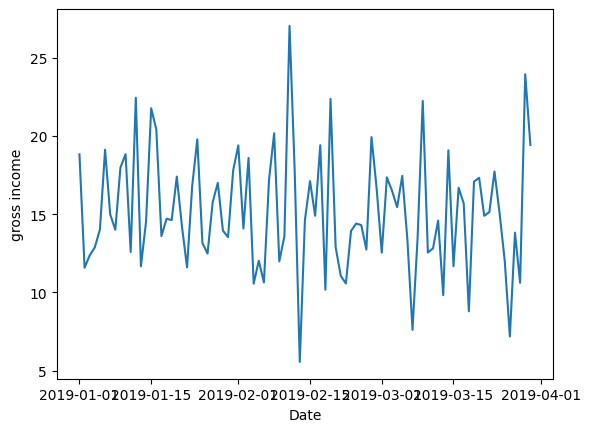

In [83]:
sns.lineplot(x=dataset.groupby(dataset.index).mean().index,
y=dataset.groupby(dataset.index).mean()['gross income'])


Plotting all the bivariate relationships of the dataset (usefull for small datasets):

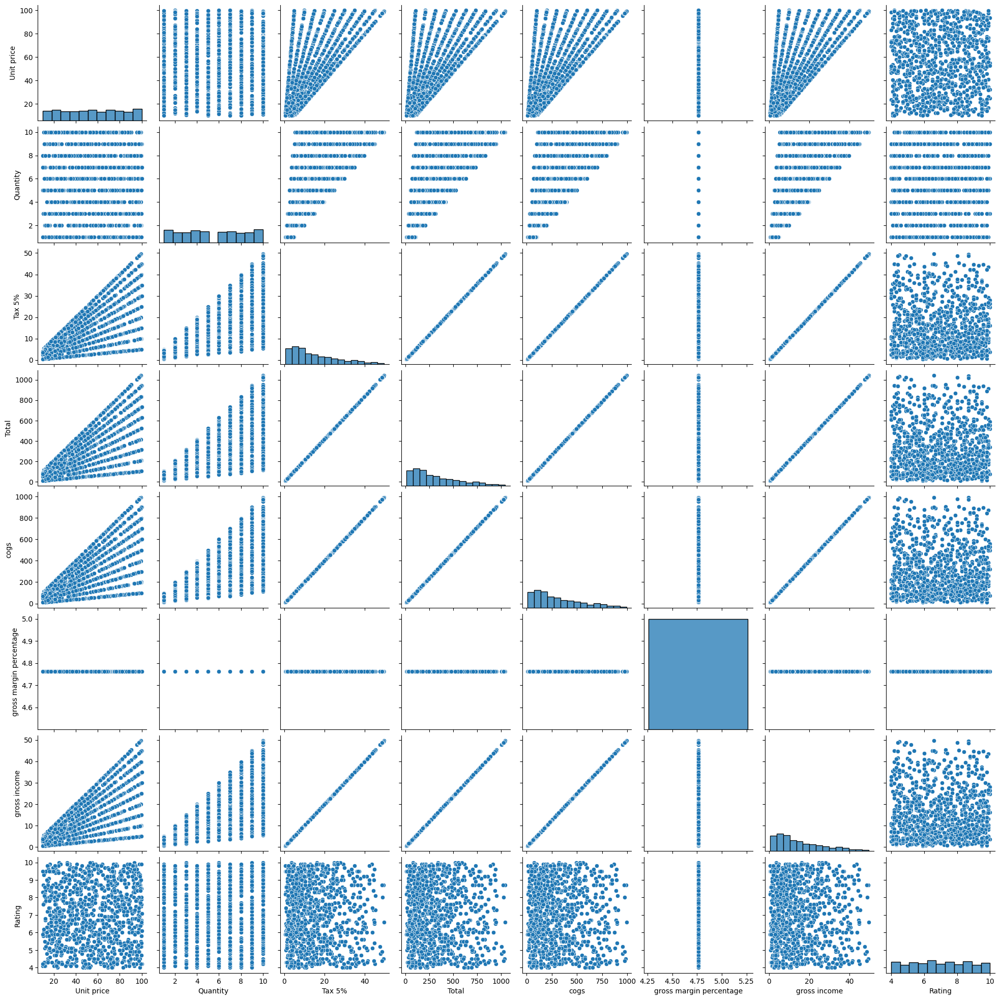

In [84]:
sns.pairplot(dataset)


Removing the duplicate values:
The out put is shown by an index and a boolean, true means a duplicate value. In this datset, there is not duplicate value, so the booleans are all False.

In [17]:
dataset.duplicated()



Date
2019-01-05    False
2019-03-08    False
2019-03-03    False
2019-01-27    False
2019-02-08    False
              ...  
2019-01-29    False
2019-03-02    False
2019-02-09    False
2019-02-22    False
2019-02-18    False
Length: 1000, dtype: bool

The number of duplicate rows:

In [18]:
dataset.duplicated().sum()

0

Filtering out any missing row (to find the exact missing values):


In [19]:
dataset[dataset.duplicated()==True]


,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Time,Payment,cogs,gross margin percentage,gross income,Rating
Date,,,,,,,,,,,,,,,,


Removing any potential duplicate value:

In [85]:
dataset.drop_duplicates(inplace=True)


Identifying the total number of missing values (per column) which in this case is 0:

In [21]:
dataset.isna().sum()

#Ratio of missing values:
#dataset.isna().sum()/len(dataset)


Invoice ID                 0
Branch                     0
City                       0
Customer type              0
Gender                     0
Product line               0
Unit price                 0
Quantity                   0
Tax 5%                     0
Total                      0
Time                       0
Payment                    0
cogs                       0
gross margin percentage    0
gross income               0
Rating                     0
dtype: int64

It is advised for most of the missing values which are numeric, mean value to be replaced


In [23]:
dataset.fillna(dataset.mean(),inplace=True)

C:\Users\User\AppData\Local\Temp\ipykernel_17500\2734239767.py:2: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  dataset.fillna(dataset.mean(),inplace=True)


For missing non-numeric values, the "mode" function is used:

In [24]:

dataset.fillna(dataset.mode().iloc[0],inplace=True)

Overall report of all values and variables (Pandas Profiler):
to organize the EDA

In [25]:

dataset = pd.read_csv('supermarket.csv')
prof= ProfileReport(dataset)
prof

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Correlation analysis between two vaiables/columns using numpy:
for example gross income vs Rating

In [91]:

np.corrcoef(dataset['gross income'],dataset['Rating'])[1][0]
#round the value: 
#round(np.corrcoef(dataset['gross income'],dataset['Rating'])[1][0])


-0.036441704997018376

Correlation matrix of the dataset:

In [93]:

dataset.corr()
#Round the values:
#np.round(dataset.corr(),2)

C:\Users\User\AppData\Local\Temp\ipykernel_17500\3402278480.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  dataset.corr()


,Unit price,Quantity,Tax 5%,Total,cogs,gross margin percentage,gross income,Rating
Unit price,1.000000,0.010778,0.633962,0.633962,0.633962,NaN,0.633962,-0.008778
Quantity,0.010778,1.000000,0.705510,0.705510,0.705510,NaN,0.705510,-0.015815
Tax 5%,0.633962,0.705510,1.000000,1.000000,1.000000,NaN,1.000000,-0.036442
Total,0.633962,0.705510,1.000000,1.000000,1.000000,NaN,1.000000,-0.036442
cogs,0.633962,0.705510,1.000000,1.000000,1.000000,NaN,1.000000,-0.036442
gross margin percentage,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
gross income,0.633962,0.705510,1.000000,1.000000,1.000000,NaN,1.000000,-0.036442
Rating,-0.008778,-0.015815,-0.036442,-0.036442,-0.036442,NaN,-0.036442,1.000000


Correlation analaysis on heatmap

C:\Users\User\AppData\Local\Temp\ipykernel_17500\3623499457.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(np.round(dataset.corr(),2),annot=True)


<AxesSubplot: >

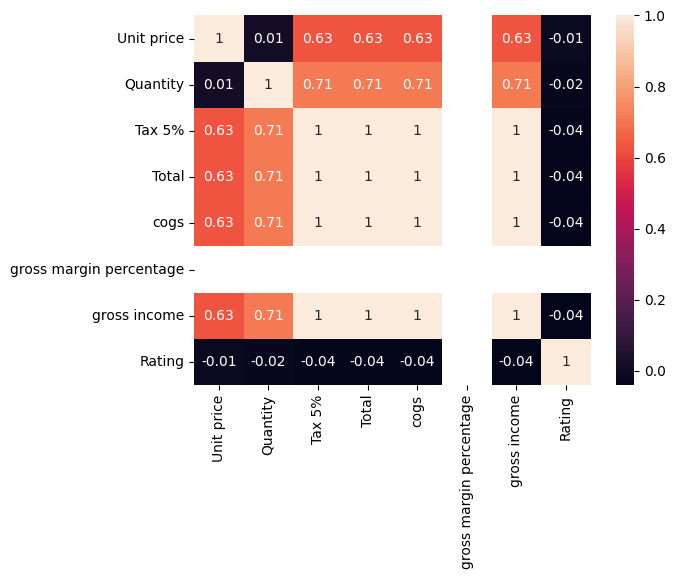

In [27]:

sns.heatmap(np.round(dataset.corr(),2),annot=True)